In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.colors import BoundaryNorm, TwoSlopeNorm
from matplotlib.ticker import MaxNLocator
import pyproj
import pycno
import pyrsig
xr.set_options(keep_attrs=True)
from matplotlib.offsetbox import AnchoredText
import cartopy.crs as ccrs

/home/jkumm/.local/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
plt.rcParams.update({
    'figure.figsize': (16, 12),                # Large, readable figures
    'figure.dpi': 400,                       # High resolution for publication
    'axes.titlesize': 24,                    # Large title font
    'axes.labelsize': 18,                    # Large axis label font
    'axes.linewidth': 1.5,                   # Thicker axes lines
    'axes.grid': True,                       # Grid for readability
    'grid.alpha': 0.3,                       # Subtle grid lines
    'xtick.labelsize': 16,                   # Large tick labels
    'ytick.labelsize': 16,
    'xtick.direction': 'in',                 # Ticks inside
    'ytick.direction': 'in',
    'xtick.major.size': 7,                   # Larger major ticks
    'ytick.major.size': 7,
    'xtick.minor.size': 4,
    'ytick.minor.size': 4,
    'legend.fontsize': 16,                   # Large legend font
    'legend.frameon': False,                 # No legend frame
    'savefig.bbox': 'tight',                 # Tight bounding box for saving
    'savefig.transparent': True,             # Transparent background
    'font.family': 'sans-serif',             # Clean font
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'lines.linewidth': 2,                    # Thicker lines
    'lines.markersize': 8,                   # Larger markers
    'pdf.fonttype': 42,                      # Editable text in PDFs
    'ps.fonttype': 42,
    'xtick.major.pad': 7,
    'ytick.major.pad': 7,
    'axes.facecolor': 'gainsboro',         # Light background for axes
    'figure.facecolor': 'white',
    'legend.loc': 'best',
    'errorbar.capsize': 4,
})

In [3]:
# Define constants
START_DATE = '2023-05-01'
END_DATE = '2023-09-30'
DROOT = '/work/MOD3DEV/jkumm/EMBER/CMAQ/36US3/run/final_scale_factors/'
RUN_NAME = 'SCALE8_FINAL'
BASE_NAME = 'BASE0'
OUTPUT_DIR = '/work/MOD3DEV/jkumm/EMBER/CMAQ/36US3/manuscript/results/final_plots/'

In [4]:
# Define projection
proj4 = '+proj=lcc +lat_0=40.0 +lon_0=97.0 +lat_1=33.0 +lat_2=45.0 +x_0=2952000.0 +y_0=2772000.0 +R=6370000.0 +to_meter=36000.0 +no_defs'
cmaq_proj = ccrs.LambertConformal(central_latitude=40.0, central_longitude=-97.0, 
                                  standard_parallels=(33.0, 45.0))

In [5]:
gf = pyrsig.open_ioapi('/work/MOD3DEV/jkumm/EMBER/CMAQ/36US3/input/mcip/aqm.t12z.grdcro2d_20230501.ncf')
proj = pyproj.Proj(gf.crs_proj4)

In [6]:
def load_all_emissions_data(model_run_name, start_date, end_date):
    """
    Loads and aggregates NOx emissions from anthropogenic, fire, and natural (biogenic) sources.
    Returns a single xarray.Dataset with total NOx emissions per day (kg N/day).
    """
    streams_dict = {
        'anthro': ['ALL', 'CMV12', 'CMV3', 'EGU', 'NONEGU', 'PT_OILGAS', 'PT_OTH', 'RWC'],
        'fire': ['PT_FIRES_MXCA', 'PT_WILDFIRES', 'PT_RXFIRES'],
        'natural': ['BIOG']
    }
    dates = pd.date_range(start_date, end_date, freq='1D')
    datasets = []

    for i, date in enumerate(dates):
        yj = date.strftime('%Y%j')
        combined_emis = None
        for group, streams in streams_dict.items():
            for stream in streams:
                emis_path = f'/work/MOD3DEV/jkumm/EMBER/CMAQ/36US3/output/2023fires.v2/{model_run_name}/{yj}/CCTM_DESID1_{stream}_CMAQv54_cb6r5_ae7_aq.36US3.35.{model_run_name}.nc'
                try:
                    if group == 'natural':
                        emis_file = xr.open_dataset(emis_path)[['NO']]
                        emis_ds = emis_file.mean(dim=('TSTEP', 'LAY')) * 3600 * 24 * 0.014
                        emis_ds['NOx'] = emis_ds['NO']
                    else:
                        emis_file = xr.open_dataset(emis_path)[['NO', 'NO2', 'HONO']]
                        emis_ds = emis_file.mean(dim=('TSTEP', 'LAY')) * 3600 * 24 * 0.014
                        emis_ds['NOx'] = emis_ds['NO'] + emis_ds['HONO'] + emis_ds['NO2']
                    emis_ds = emis_ds.drop_vars([v for v in emis_ds.data_vars if v != 'NOx'])
                    emis_ds = emis_ds.expand_dims('TSTEP')
                    emis_ds = emis_ds.assign_coords(TSTEP=[date])
                    if combined_emis is None:
                        combined_emis = emis_ds
                    else:
                        combined_emis = combined_emis + emis_ds
                except FileNotFoundError:
                    continue
        if combined_emis is not None:
            datasets.append(combined_emis)
    if datasets:
        total_emis = xr.concat(datasets, dim='TSTEP')
        return total_emis
    else:
        print("No emissions data loaded.")
        return None

In [7]:
def load_fire_emissions_data(model_run_name, start_date, end_date):
    """
    Calculates total NOx emissions per day in the file in units kg N per day.
    If 'FIRES' stream is specified, combines Canadian and US wildfire emissions.
    """
    datasets = []
    dates = pd.date_range(start_date, end_date, freq='1D').strftime('%Y%j')
    dates2 = pd.date_range(start_date, end_date, freq='1D')
    streams = ['PT_FIRES_MXCA', 'PT_WILDFIRES', 'PT_RXFIRES']
    i = 0
    for idate in dates:
        print(idate, end='\r')
        combined_emis = None
        for stream in streams:
            emis_path = f'/work/MOD3DEV/jkumm/EMBER/CMAQ/36US3/output/2023fires.v2/{model_run_name}/{idate}/CCTM_DESID1_{stream}_CMAQv54_cb6r5_ae7_aq.36US3.35.{model_run_name}.nc'
            try:
                emis_file = xr.open_dataset(emis_path)[['NO', 'NO2', 'HONO']]
                # emis_ds = emis_file.isel(TSTEP=slice(0,-1), LAY=0) * 3600 * 0.014
                emis_ds = emis_file.mean(dim=('TSTEP', 'LAY')) * 3600 * 24 * 0.014  # Convert to kg N/day
                emis_ds['NOx'] = emis_ds['NO'] + emis_ds['HONO'] + emis_ds['NO2']
                emis_ds.coords['TSTEP'] = pd.to_datetime(dates2[i], format='%Y-%m-%d')

                if combined_emis is None:
                    combined_emis = emis_ds
                else:
                    combined_emis += emis_ds
            except FileNotFoundError:
                print(f"Warning: File not found: {emis_path}")
        
        if combined_emis is not None:
            datasets.append(combined_emis)
        i += 1

    if datasets:
        emis_data = xr.concat(datasets, dim='TSTEP')
        return emis_data
    else:
        print("No emissions data loaded.")
        return None

In [8]:
def convert_to_short_tons_NOX_as_NO2(emis_data):
    nox_emis = emis_data['NOx']
    nox_emis_conv = (nox_emis * 0.001 * (46/14)) # convert from kg N to Mg (metric tons) NOx as NO2
    return nox_emis_conv

In [9]:
total_posterior_emissions = load_all_emissions_data(RUN_NAME, START_DATE, END_DATE)

In [10]:
total_prior_emissions = load_all_emissions_data(BASE_NAME, START_DATE, END_DATE)

In [11]:
total_posterior_emissions_short_tons = convert_to_short_tons_NOX_as_NO2(total_posterior_emissions)
total_prior_emissions_short_tons = convert_to_short_tons_NOX_as_NO2(total_prior_emissions)

In [12]:
emissions_changes = total_posterior_emissions.sum(dim='TSTEP') - total_prior_emissions.sum(dim='TSTEP')
emissions_changes_short_tons = total_posterior_emissions_short_tons.sum(dim='TSTEP') - total_prior_emissions_short_tons.sum(dim='TSTEP')

In [13]:
posterior_fire_emissions = load_fire_emissions_data(RUN_NAME, START_DATE, END_DATE)
prior_fire_emissions = load_fire_emissions_data(BASE_NAME, START_DATE, END_DATE)

In [14]:
posterior_fire_emissions_short_tons = convert_to_short_tons_NOX_as_NO2(posterior_fire_emissions)
prior_fire_emissions_short_tons = convert_to_short_tons_NOX_as_NO2(prior_fire_emissions)

In [15]:
fire_fraction = prior_fire_emissions.sum(dim='TSTEP') / total_prior_emissions.sum(dim='TSTEP')
fire_dominated_mask = fire_fraction['NOx'] > 0.5

In [37]:
print(f"posterior emissions (Tg N): {np.sum(total_posterior_emissions['NOx'].values/1e9)}")
print(f"prior emissions (Tg N): {np.sum(total_prior_emissions['NOx'].values)/1e9}")
print(f"difference (Tg N): {np.sum(emissions_changes['NOx'].values)/1e9}")

posterior emissions (Tg N): 2.4512295722961426
prior emissions (Tg N): 2.55677824
difference (Tg N): -0.105550176


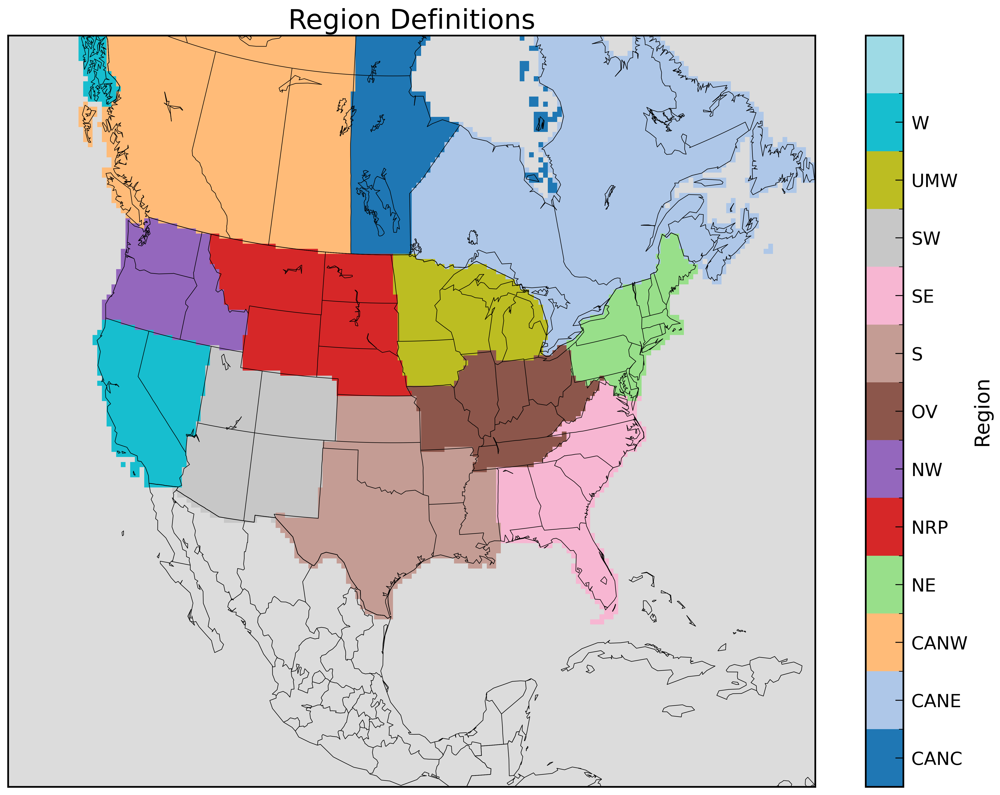

In [16]:
f = pyrsig.open_ioapi('/work/ROMO/gis_rasters/NOAA/NOAA_CLIMATE_REGIONS_36US3.nc')
ordkeys = [k[5:] for k in sorted(f.data_vars) if k not in ('NOAA_DOM', 'NOAA_TOT', 'TFLAG')]
Z = f['NOAA_DOM'].where(lambda x: x>0)
Z.attrs['units'] = ''
Z.attrs['long_name'] = 'Region'
qm = Z.plot(cmap='tab20', levels=np.arange(len(ordkeys) + 2) + .5)
qm.colorbar.set_ticks(np.arange(len(ordkeys)) + 1)
qm.colorbar.set_ticklabels(ordkeys)
qm.colorbar.set_label('Region')
qm.axes.set(facecolor='gainsboro', title='Region Definitions', xticks=[], yticks=[], xlabel='', ylabel='')
pycno.cno(f.crs_proj4).drawstates(resnum=3)
del f
qm.figure.savefig('regions.png')

In [17]:
# Create a dictionary of masks for each NOAA climate region
region_map = Z.squeeze().copy()  # Make sure region_map is 2D (ROW, COL)

region_masks = {}
for i, region in enumerate(ordkeys, 1):
    # Z == i identifies the grid cells belonging to this region
    region_masks[region] = (Z.squeeze() == i)

In [18]:
region_masks['CANW_FIRES'] = region_masks['CANW'] & (fire_dominated_mask)
region_masks['CANC_FIRES'] = region_masks['CANC'] & (fire_dominated_mask)
region_masks['CANE_FIRES'] = region_masks['CANE'] & (fire_dominated_mask)

In [19]:
import cartopy.feature as cfeature
from shapely import geometry as sg
from rasterio.features import shapes
def _format_number(val):
    absval = abs(val)
    if absval >= 1e6:
        return f"{val/1e6:.2f}M"
    elif absval >= 1e3:
        return f"{val/1e3:.0f}k"
    else:
        return f"{val:.0f}"
def plot_final_emissions_figure(
    emissions_changes_short_tons,
    region_masks,
    OUTPUT_DIR,
    total_prior_emissions_short_tons,
    total_posterior_emissions_short_tons,
    region_order,
    region_labels,
    domain_prior_total,
    domain_post_total,
    save_name="final_emissions_twopanel"
):
    x = emissions_changes_short_tons['COL'].values
    y = emissions_changes_short_tons['ROW'].values
    change = emissions_changes_short_tons
    abs_change = np.abs(change)
    threshold = np.round(np.nanpercentile(abs_change, 75))
    masked_change = change.where(np.round(abs_change, 3) > threshold)

    
    fig = plt.figure(figsize=(32, 13), constrained_layout=True)
    gs = fig.add_gridspec(1, 2, width_ratios=[1.5, 1.8], wspace=0.10, hspace=0.1)
    
    fig.text(-0.08, 0.98, "(a)", fontsize=32, weight="bold", va="top", ha="left", transform=fig.transFigure)
    fig.text(0.47, 0.98, "(b)", fontsize=32, weight="bold", va="top", ha="left", transform=fig.transFigure)

    # --- (a) Spatial panel ---
    ax0 = fig.add_subplot(gs[0], projection=cmaq_proj)
    ax0.set_facecolor('gainsboro')
    ax0.set_xticks([])
    ax0.set_yticks([])

    # Region polygons (transparent fill, black border)
    for region_id in np.unique(region_map):
        if region_id <= 0:
            continue
        mask = (region_map == region_id).astype(np.uint8)
        for geom, val in shapes(mask, mask=mask, connectivity=4):
            if val == 1:
                def pixel_to_proj(coords):
                    ncols = x.shape[0]
                    nrows = y.shape[0]
                    result = []
                    for col, row in coords:
                        col_idx = min(max(int(col), 0), ncols - 1)
                        row_idx = min(max(int(row), 0), nrows - 1)
                        x_proj, y_proj = x[col_idx], y[row_idx]
                        result.append((x_proj, y_proj))
                    return result
                poly = sg.shape(geom)
                if poly.geom_type == 'Polygon':
                    new_poly = sg.Polygon(pixel_to_proj(poly.exterior.coords))
                    ax0.add_geometries([new_poly], crs=cmaq_proj,
                        facecolor=(0,0,0,0), edgecolor='black', linewidth=2.0, zorder=3)

    # Emissions change mesh
    X, Y = np.meshgrid(x, y)
    cmap = plt.get_cmap('RdBu_r')
    vmax = 600
    vmin = -vmax
    mesh = ax0.pcolormesh(X, Y, masked_change, cmap=cmap, shading='auto', vmin=vmin, vmax=vmax, zorder=2, transform=cmaq_proj)
    ax0.set_xlim(x.min(), x.max())
    ax0.set_ylim(y.min(), y.max())
    ax0.set_title("NO$_x$ Emissions Changes: Posterior – Prior", weight="bold", pad=10, fontsize=36)
    ax0.gridlines(draw_labels=False, linewidth=0.3)
    cbar = fig.colorbar(mesh, ax=ax0, orientation="vertical", pad=0.03, aspect=30)
    cbar.set_label('NO$_x$ Emissions Difference [short tons]', fontsize=32, labelpad=10)
    cbar.ax.tick_params(labelsize=28)
    cbar.set_ticks(np.arange(-600, 601, 200))
    pycno.cno(proj=proj).drawstates(ax=ax0, linewidth=1.0, color='dimgray')

    # --- (b) Regional bar panel ---
    ax1 = fig.add_subplot(gs[1])
    prior_vals, posterior_vals, pct_changes = [], [], []
    for region in region_order:
        mask = region_masks[region]
        prior = float((total_prior_emissions_short_tons.sum(dim='TSTEP') * mask).sum())
        post = float((total_posterior_emissions_short_tons.sum(dim='TSTEP') * mask).sum())
        prior_vals.append(prior)
        posterior_vals.append(post)
        pct_changes.append(100 * (post - prior) / prior if prior != 0 else np.nan)

    n_us = 8
    n_ca = len(region_order) - n_us
    x_us = np.arange(n_us) * 1.5
    x_ca = np.arange(n_ca) * 1.5 + (x_us[-1] + 2.5)
    x_total = np.concatenate([x_us, x_ca])
    width = 0.60

    prior_color = "#999999"
    post_color = "#009E73"
    rects1 = ax1.bar(x_total - width/2, prior_vals, width, label='Prior', color=prior_color, zorder=2)
    rects2 = ax1.bar(x_total + width/2, posterior_vals, width, label='Posterior', color=post_color, zorder=2)
    ax1.set_xticks(x_total)
    ax1.set_xticklabels(region_labels, fontsize=32, rotation=30, ha='right')
    ax1.tick_params(axis='y', labelsize=28)
    ax1.set_title("Regional NO$_x$ Emissions Totals", fontsize=36, weight='bold', pad=10)
    ax1.grid(axis='y', alpha=0.25, zorder=0)
    ax1.axvline(x_us[-1] + 1.25, color='k', linestyle='--', linewidth=1.5, alpha=0.5, zorder=3)
    ax1.ticklabel_format(style='plain', axis='y')
    # Annotate bars and percent changes
    for i, (rect1, rect2) in enumerate(zip(rects1, rects2)):
        h1, h2 = rect1.get_height(), rect2.get_height()
        diff = h2 - h1
        # y_offset_1 = -70 if diff >= 0 else -50
        # y_offset_2 = -45 if diff >= 0 else -70
        pct_offset = 10 if diff >= 0 else 30
        # ax1.annotate(_format_number(h1),
        #     xy=(rect1.get_x() + rect1.get_width() / 2, h1),
        #     xytext=(0, y_offset_1), textcoords="offset points",
        #     ha='center', va='top', fontsize=24, color='black', weight='bold', zorder=3)
        # ax1.annotate(_format_number(h2),
        #     xy=(rect2.get_x() + rect2.get_width() / 2, h2),
        #     xytext=(0, y_offset_2), textcoords="offset points",
        #     ha='center', va='top', fontsize=24, color='black', weight='bold', zorder=3)
        pct = pct_changes[i]
        pct_color = "#0072b2" if pct <= 0 else "#AC0000"
        if np.isfinite(pct):
            ax1.annotate(f'{pct:+.1f}%',
                xy=(rect2.get_x() + rect2.get_width() / 2, h2),
                xytext=(0, pct_offset), textcoords="offset points",
                ha='center', va='bottom', fontsize=24, color=pct_color, weight='bold', zorder=3)
    ax1.set_ylim(top=max(max(prior_vals), max(posterior_vals)) * 1.12)
    ax1.legend(fontsize=24, loc='upper center', frameon=False, ncol=2, bbox_to_anchor=(0.5, 1.00))
    ax1.set_axisbelow(True)
    ax1.set_ylabel('Total NO$_x$ Emissions [short tons]', fontsize=32)
    # --- Domain totals box ---
    change_dom = domain_post_total - domain_prior_total
    pct_dom = 100 * (domain_post_total - domain_prior_total) / domain_prior_total
    dom_text = (
        r"$\bf{Domain\ Totals:}$" + "\n"
        r"Prior: $\mathbf{" + _format_number(domain_prior_total) + "}$ short tons\n"
        r"Posterior: $\mathbf{" + _format_number(domain_post_total) + "}$ short tons\n"
        r"Change: $\mathbf{" + _format_number(change_dom) + "}$ short tons ($\mathbf{" + f"{pct_dom:+.1f}" + r"\%}$)"
    )
    fig.text(
        0.10, 0.015, dom_text,
        fontsize=32,
        ha='left', va='bottom',
        bbox=dict(facecolor='white', alpha=0.92, edgecolor='gainsboro', boxstyle='round,pad=0.3', linewidth=1.2),
        zorder=10,
    )
    plt.suptitle("Total NO$_x$ Emissions, May-Sep 2023: Prior vs. Posterior", fontsize=42, weight='bold', y=1.08)
    # plt.tight_layout(rect=[0,0.03,1,0.98])
    # plt.subplots_adjust(top=0.95, bottom=0.08)
    plt.savefig(f"{OUTPUT_DIR}/{save_name}.png", dpi=600, bbox_inches="tight", transparent=False)
    plt.savefig(f"{OUTPUT_DIR}/{save_name}.pdf", bbox_inches="tight", transparent=False)
    plt.show()
    plt.close()

# Example usage:
region_order = ['W', 'NW', 'SW', 'S', 'UMW', 'OV', 'SE', 'NE', 'CANW_FIRES','CANE_FIRES']
region_labels = ['West','Northwest','Southwest','South','Upper Midwest','Ohio Valley','Southeast','Northeast','W. Canada (fire)','E. Canada (fire)']
domain_prior_total = float(total_prior_emissions_short_tons.sum())
domain_post_total = float(total_posterior_emissions_short_tons.sum())

plot_final_emissions_figure(
    emissions_changes_short_tons,
    region_masks,
    OUTPUT_DIR,
    total_prior_emissions_short_tons,
    total_posterior_emissions_short_tons,
    region_order,
    region_labels,
    domain_prior_total,
    domain_post_total,
    save_name="final_emissions_twopanel"
)

In [40]:
total_prior_emissions_TgN = total_prior_emissions['NOx'] * 1e-9
total_posterior_emissions_TgN = total_posterior_emissions['NOx'] * 1e-9
emissions_changes_TgN = total_posterior_emissions_TgN.sum(dim='TSTEP') - total_prior_emissions_TgN.sum(dim='TSTEP')
domain_post_total_TgN = float(total_posterior_emissions_TgN.sum()) * 1e-9
domain_prior_total_TgN = float(total_prior_emissions_TgN.sum()) * 1e-9
# Example usage:
region_order = ['W', 'NW', 'SW', 'S', 'UMW', 'OV', 'SE', 'NE', 'CANW','CANE']
region_labels = ['West','Northwest','Southwest','South','Upper Midwest','Ohio Valley','Southeast','Northeast','W. Canada','E. Canada']


<xarray.DataArray 'NOx' ()>
array(2.4512296, dtype=float32)
Attributes:
    long_name:  NO              
    units:      mol s-1         
    var_desc:   Emission Rate of NO from ALL emissions                       ...

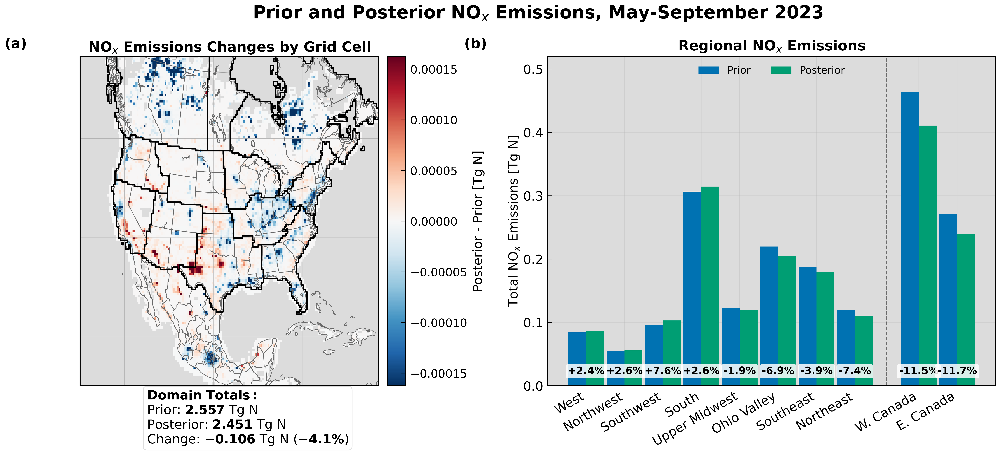

In [52]:
import cartopy.feature as cfeature
from shapely import geometry as sg
from rasterio.features import shapes
def _format_number(val):
    absval = abs(val)
    if absval >= 1e6:
        return f"{val/1e6:.2f}M"
    elif absval >= 1e3:
        return f"{val/1e3:.0f}k"
    else:
        return f"{val:.0f}"
def plot_final_emissions_figure(
    emissions_changes,
    region_masks,
    OUTPUT_DIR,
    total_prior_emissions,
    total_posterior_emissions,
    region_order,
    region_labels,
    domain_prior_total,
    domain_post_total,
    save_name="final_emissions_twopanel"
):
    x = emissions_changes['COL'].values
    y = emissions_changes['ROW'].values
    change = emissions_changes
    abs_change = np.abs(change)
    threshold = 1e-9
    masked_change = change.where(abs_change > threshold)

    
    fig = plt.figure(figsize=(20, 9), constrained_layout=True)
    gs = fig.add_gridspec(1, 2, width_ratios=[1.2, 1.8], wspace=0.05)
    
    fig.text(-0.08, 1, "(a)", fontsize=22, weight="bold", va="top", ha="left", transform=fig.transFigure)
    fig.text(0.42, 1, "(b)", fontsize=22, weight="bold", va="top", ha="left", transform=fig.transFigure)

    # --- (a) Spatial panel ---
    ax0 = fig.add_subplot(gs[0], projection=cmaq_proj, aspect='auto')
    ax0.set_facecolor('gainsboro')
    ax0.set_xticks([])
    ax0.set_yticks([])

    # Region polygons (transparent fill, black border)
    for region_id in np.unique(region_map):
        if region_id <= 0:
            continue
        mask = (region_map == region_id).astype(np.uint8)
        for geom, val in shapes(mask, mask=mask, connectivity=4):
            if val == 1:
                def pixel_to_proj(coords):
                    ncols = x.shape[0]
                    nrows = y.shape[0]
                    result = []
                    for col, row in coords:
                        col_idx = min(max(int(col), 0), ncols - 1)
                        row_idx = min(max(int(row), 0), nrows - 1)
                        x_proj, y_proj = x[col_idx], y[row_idx]
                        result.append((x_proj, y_proj))
                    return result
                poly = sg.shape(geom)
                if poly.geom_type == 'Polygon':
                    new_poly = sg.Polygon(pixel_to_proj(poly.exterior.coords))
                    ax0.add_geometries([new_poly], crs=cmaq_proj,
                        facecolor=(0,0,0,0), edgecolor='black', linewidth=2.0, zorder=3)

    # Emissions change mesh
    X, Y = np.meshgrid(x, y)
    cmap = plt.get_cmap('RdBu_r')
    vmax = np.nanpercentile(np.abs(masked_change), 97.5)
    vmin = -vmax
    mesh = ax0.pcolormesh(X, Y, masked_change, cmap=cmap, shading='auto', vmin=vmin, vmax=vmax, zorder=2, transform=cmaq_proj)
    ax0.set_xlim(x.min(), x.max())
    ax0.set_ylim(y.min(), y.max())
    ax0.set_title("NO$_x$ Emissions Changes by Grid Cell", weight="bold", pad=8, fontsize=22)
    ax0.gridlines(draw_labels=False, linewidth=0.3)
    cbar = fig.colorbar(mesh, ax=ax0, orientation="vertical", pad=0.03, aspect=18)
    cbar.set_label('Posterior - Prior [Tg N]', fontsize=20, labelpad=8)
    cbar.ax.tick_params(labelsize=18)
    # cbar.set_ticks(np.arange(-vmax, vmax, 200))
    pycno.cno(proj=proj).drawstates(ax=ax0, linewidth=1.0, color='dimgray')

    # --- (b) Regional bar panel ---
    ax1 = fig.add_subplot(gs[1])
    prior_vals, posterior_vals, pct_changes = [], [], []
    for region in region_order:
        mask = region_masks[region]
        prior = float((total_prior_emissions.sum(dim='TSTEP') * mask).sum())
        post = float((total_posterior_emissions.sum(dim='TSTEP') * mask).sum())
        prior_vals.append(prior)
        posterior_vals.append(post)
        pct_changes.append(100 * (post - prior) / prior if prior != 0 else np.nan)

    n_us = 8
    n_ca = len(region_order) - n_us
    x_us = np.arange(n_us) * 1.5
    x_ca = np.arange(n_ca) * 1.5 + (x_us[-1] + 2.5)
    x_total = np.concatenate([x_us, x_ca])
    width = 0.7

    prior_color = "#0072B2"
    post_color = "#009E73"
    rects1 = ax1.bar(x_total - width/2, prior_vals, width, label='Prior', color=prior_color, zorder=2)
    rects2 = ax1.bar(x_total + width/2, posterior_vals, width, label='Posterior', color=post_color, zorder=2)
    ax1.set_xticks(x_total)
    ax1.set_xticklabels(region_labels, fontsize=20, rotation=30, ha='right')
    ax1.tick_params(axis='y', labelsize=20)
    ax1.set_title("Regional NO$_x$ Emissions", fontsize=22, weight='bold', pad=10)
    ax1.grid(axis='y', alpha=0.25, zorder=0)
    ax1.axvline(x_us[-1] + 1.25, color='k', linestyle='--', linewidth=1.5, alpha=0.5, zorder=3)
    ax1.ticklabel_format(style='plain', axis='y')
    ax1.set_ylabel('Total NO$_x$ Emissions [Tg N]', fontsize=20)
    # Annotate bars and percent changes
    for i, (rect1, rect2) in enumerate(zip(rects1, rects2)):
        pct = pct_changes[i]
        pct_color = 'black'
        if np.isfinite(pct):
            ax1.annotate(
                f'{pct:+.1f}%',
                xy=(rect1.get_x() + rect1.get_width(), 0.01 * ax1.get_ylim()[1]),
                xytext=(0, 10),
                textcoords="offset points",
                ha='center',
                va='bottom',
                fontsize=16,
                color='black',
                weight='bold',
                zorder=5,
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.85, boxstyle='round,pad=0.2')
            )
    ax1.set_ylim(top=max(max(prior_vals), max(posterior_vals)) * 1.12)
    ax1.legend(fontsize=16, loc='upper center', frameon=False, ncol=2, bbox_to_anchor=(0.5, 1.00))
    ax1.set_axisbelow(True)
    # --- Domain totals box ---
    change_dom = domain_post_total - domain_prior_total
    pct_dom = 100 * (domain_post_total - domain_prior_total) / domain_prior_total
    dom_text = (
        r"$\bf{Domain\ Totals:}$" + "\n"
        r"Prior: $\mathbf{" + f"{domain_prior_total:.3f}" + "}$ Tg N\n"
        r"Posterior: $\mathbf{" + f"{domain_post_total:.3f}" + "}$ Tg N\n"
        r"Change: $\mathbf{" + f"{change_dom:.3f}" + "}$ Tg N ($\mathbf{" + f"{pct_dom:+.1f}" + r"\%}$)"
    )
    fig.text(
        0.075, 0.01, dom_text,
        fontsize=20,
        ha='left', va='bottom',
        bbox=dict(facecolor='white', alpha=0.92, edgecolor='gainsboro', boxstyle='round,pad=0.3', linewidth=1.2),
        zorder=10,
    )
    plt.suptitle("Prior and Posterior NO$_x$ Emissions, May-September 2023", fontsize=28, weight='bold', y=1.08)
    plt.savefig(f"{OUTPUT_DIR}/{save_name}.png", dpi=600, bbox_inches="tight", transparent=False)
    plt.savefig(f"{OUTPUT_DIR}/{save_name}.pdf", bbox_inches="tight", transparent=False)
    plt.show()
    plt.close()
# Compute domain totals in Tg N for the annotation box
domain_prior_total_TgN = float(total_prior_emissions_TgN.sum().values)
domain_post_total_TgN = float(total_posterior_emissions_TgN.sum().values)

plot_final_emissions_figure(
    emissions_changes_TgN,
    region_masks,
    OUTPUT_DIR,
    total_prior_emissions_TgN,
    total_posterior_emissions_TgN,
    region_order,
    region_labels,
    domain_prior_total_TgN,
    domain_post_total_TgN,
    save_name="final_emissions_twopanel_TgN"
)

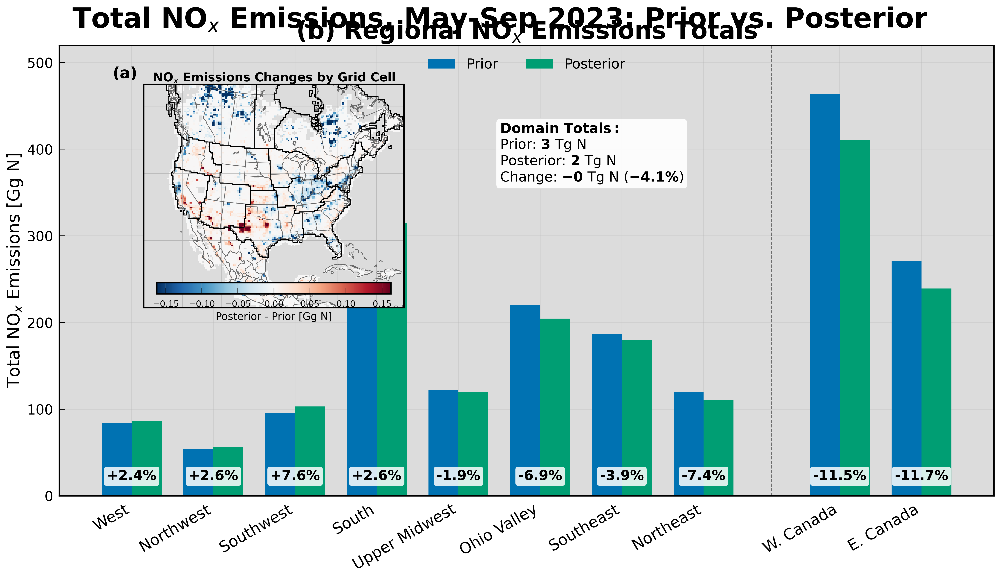

In [22]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def plot_final_emissions_figure_inset(
    emissions_changes,
    region_masks,
    OUTPUT_DIR,
    total_prior_emissions,
    total_posterior_emissions,
    region_order,
    region_labels,
    domain_prior_total,
    domain_post_total,
    save_name="final_emissions_twopanel_inset"
):
    x = emissions_changes['COL'].values
    y = emissions_changes['ROW'].values
    change = emissions_changes
    abs_change = np.abs(change)
    threshold = 1e-6
    masked_change = change.where(abs_change > threshold)

    fig, ax1 = plt.subplots(figsize=(16, 9), constrained_layout=True)

    # --- (a) Inset map panel ---
    # Only use inset_axes, and pass projection!
    # Create inset axes with projection using fig.add_axes for compatibility
    bbox = ax1.get_position()
    # Calculate position for inset (adjust as needed)
    inset_width = 0.38 * bbox.width
    inset_height = 0.52 * bbox.height
    inset_left = bbox.x0
    inset_bottom = bbox.y0 + bbox.height - inset_height

    axins = fig.add_axes(
        [inset_left, inset_bottom, inset_width, inset_height],
        projection=cmaq_proj
    )
    axins.set_facecolor('gainsboro')
    axins.set_xticks([])
    axins.set_yticks([])

    # Region polygons (transparent fill, black border)
    for region_id in np.unique(region_map):
        if region_id <= 0:
            continue
        mask = (region_map == region_id).astype(np.uint8)
        for geom, val in shapes(mask, mask=mask, connectivity=4):
            if val == 1:
                def pixel_to_proj(coords):
                    ncols = x.shape[0]
                    nrows = y.shape[0]
                    result = []
                    for col, row in coords:
                        col_idx = min(max(int(col), 0), ncols - 1)
                        row_idx = min(max(int(row), 0), nrows - 1)
                        x_proj, y_proj = x[col_idx], y[row_idx]
                        result.append((x_proj, y_proj))
                    return result
                poly = sg.shape(geom)
                if poly.geom_type == 'Polygon':
                    new_poly = sg.Polygon(pixel_to_proj(poly.exterior.coords))
                    axins.add_geometries([new_poly], crs=cmaq_proj,
                        facecolor=(0,0,0,0), edgecolor='black', linewidth=1.0, zorder=3)

    X, Y = np.meshgrid(x, y)
    cmap = plt.get_cmap('RdBu_r')
    vmax = np.nanpercentile(np.abs(masked_change), 97.5)
    vmin = -vmax
    mesh = axins.pcolormesh(X, Y, masked_change, cmap=cmap, shading='auto', vmin=vmin, vmax=vmax, zorder=2, transform=cmaq_proj)
    axins.set_xlim(x.min(), x.max())
    axins.set_ylim(y.min(), y.max())
    axins.set_title("NO$_x$ Emissions Changes by Grid Cell", fontsize=14, weight="bold", pad=2)
    axins.gridlines(draw_labels=False, linewidth=0.3)
    pycno.cno(proj=proj).drawstates(ax=axins, linewidth=0.7, color='dimgray')

    # Inset colorbar
    cbins = inset_axes(axins, width="90%", height="5%", loc='lower center', borderpad=1)
    cbar = fig.colorbar(mesh, cax=cbins, orientation="horizontal")
    cbar.set_label('Posterior - Prior [Gg N]', fontsize=12, labelpad=4)
    cbar.ax.tick_params(labelsize=10)

    # Inset label (a)
    axins.text(-0.12, 1.08, "(a)", transform=axins.transAxes, fontsize=18, weight="bold", va="top", ha="left")

    # --- (b) Main bar panel ---
    prior_vals, posterior_vals, pct_changes = [], [], []
    for region in region_order:
        mask = region_masks[region]
        prior = float((total_prior_emissions.sum(dim='TSTEP') * mask).sum())
        post = float((total_posterior_emissions.sum(dim='TSTEP') * mask).sum())
        prior_vals.append(prior)
        posterior_vals.append(post)
        pct_changes.append(100 * (post - prior) / prior if prior != 0 else np.nan)

    n_us = 8
    n_ca = len(region_order) - n_us
    x_us = np.arange(n_us) * 1.5
    x_ca = np.arange(n_ca) * 1.5 + (x_us[-1] + 2.5)
    x_total = np.concatenate([x_us, x_ca])
    width = 0.55

    prior_color = "#0072B2"
    post_color = "#009E73"
    rects1 = ax1.bar(x_total - width/2, prior_vals, width, label='Prior', color=prior_color, zorder=2)
    rects2 = ax1.bar(x_total + width/2, posterior_vals, width, label='Posterior', color=post_color, zorder=2)
    ax1.set_xticks(x_total)
    ax1.set_xticklabels(region_labels, fontsize=18, rotation=30, ha='right')
    ax1.tick_params(axis='y', labelsize=16)
    ax1.set_title("(b) Regional NO$_x$ Emissions Totals", fontsize=28, weight='bold', pad=8)
    ax1.grid(axis='y', alpha=0.25, zorder=0)
    ax1.axvline(x_us[-1] + 1.25, color='k', linestyle='--', linewidth=1.0, alpha=0.5, zorder=3)
    ax1.ticklabel_format(style='plain', axis='y')
    # Annotate bars and percent changes
    for i, (rect1, rect2) in enumerate(zip(rects1, rects2)):
        pct = pct_changes[i]
        pct_color = 'black'
        if np.isfinite(pct):
            ax1.annotate(
                f'{pct:+.1f}%',
                xy=(rect1.get_x() + rect1.get_width(), 0.01 * ax1.get_ylim()[1]),
                xytext=(0, 10),
                textcoords="offset points",
                ha='center',
                va='bottom',
                fontsize=16,
                color='black',
                weight='bold',
                zorder=5,
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.85, boxstyle='round,pad=0.2')
            )
    ax1.set_ylim(top=max(max(prior_vals), max(posterior_vals)) * 1.12)
    ax1.legend(fontsize=16, loc='upper center', frameon=False, ncol=2, bbox_to_anchor=(0.5, 1.00))
    ax1.set_axisbelow(True)
    ax1.set_ylabel('Total NO$_x$ Emissions [Gg N]', fontsize=20)

    # --- Domain totals box ---
    change_dom = domain_post_total - domain_prior_total
    pct_dom = 100 * (domain_post_total - domain_prior_total) / domain_prior_total
    dom_text = (
        r"$\bf{Domain\ Totals:}$" + "\n"
        r"Prior: $\mathbf{" + _format_number(domain_prior_total) + "}$ Tg N\n"
        r"Posterior: $\mathbf{" + _format_number(domain_post_total) + "}$ Tg N\n"
        r"Change: $\mathbf{" + _format_number(change_dom) + "}$ Tg N ($\mathbf{" + f"{pct_dom:+.1f}" + r"\%}$)"
    )
    fig.text(
        0.50, 0.70, dom_text,
        fontsize=16,
        ha='left', va='bottom',
        bbox=dict(facecolor='white', alpha=0.92, edgecolor='gainsboro', boxstyle='round,pad=0.3', linewidth=1.2),
        zorder=10,
    )
    fig.suptitle("Total NO$_x$ Emissions, May-Sep 2023: Prior vs. Posterior", fontsize=32, weight='bold', y=1.02)
    plt.savefig(f"{OUTPUT_DIR}/{save_name}.png", dpi=600, bbox_inches="tight", transparent=False)
    plt.savefig(f"{OUTPUT_DIR}/{save_name}.pdf", bbox_inches="tight", transparent=False)
    plt.show()
    plt.close()

plot_final_emissions_figure_inset(
    emissions_changes_GgN,
    region_masks,
    OUTPUT_DIR,
    total_prior_emissions_GgN,
    total_posterior_emissions_GgN,
    region_order,
    region_labels,
    domain_prior_total_TgN,
    domain_post_total_TgN,
    save_name="final_emissions_twopanel_inset"
)

In [23]:


# Get the threshold used in the plotting function
abs_change = np.abs(emissions_changes['NOx'])
threshold = np.round(np.nanpercentile(abs_change, 75))
above_thresh_mask = np.round(abs_change, 3) > threshold

print("Fraction of grid cells above threshold by region:")
for region in region_order:
    mask = region_masks[region]
    total_cells = np.sum(mask)
    if total_cells == 0:
        frac = np.nan
    else:
        frac = np.sum(mask & above_thresh_mask) / total_cells
    print(f"{region_labels[region_order.index(region)]}: {frac:.3f}")

Fraction of grid cells above threshold by region:
West: 0.477
Northwest: 0.525
Southwest: 0.497
South: 0.825
Upper Midwest: 0.739
Ohio Valley: 0.917
Southeast: 0.796
Northeast: 0.725
W. Canada: 0.335
E. Canada: 0.208


In [24]:
# region_order = ['W', 'NW', 'SW', 'NRP', 'S', 'UMW', 'OV', 'SE', 'NE', 'CANW_FIRES', 'CANC_FIRES', 'CANE_FIRES']
# region_labels = ['West','Northwest','Southwest', 'Northern Rockies & Plains', 'South','Upper Midwest','Ohio Valley','Southeast','Northeast','W. Canada (fire)','E. Canada (fire)']

# # Calculate fraction of days with significant emissions change at each grid cell
# change_per_day = total_posterior_emissions_short_tons - total_prior_emissions_short_tons
# change_mask = np.abs(change_per_day) > 0.01
# pct_days_changed = 100 * change_mask.sum(dim='TSTEP') / change_mask.sizes['TSTEP']

# plt.figure(figsize=(14, 10))
# ax = plt.subplot(1, 1, 1, projection=cmaq_proj)
# X, Y = np.meshgrid(change_per_day['COL'].values, change_per_day['ROW'].values)
# cmap = plt.get_cmap('viridis')
# im = ax.pcolormesh(X, Y, pct_days_changed, cmap=cmap, shading='auto', vmin=0, vmax=100, transform=cmaq_proj)
# plt.colorbar(im, ax=ax, label='% of days with change > 0.01 short tons', pad=0.02)
# ax.set_title('% of Days with Significant Emissions Change (>0.01 short tons)', fontsize=22)
# ax.set_xticks([])
# ax.set_yticks([])
# pycno.cno(proj=proj).drawstates(ax=ax, linewidth=1.0, color='dimgray')
# plt.show()

In [25]:

# mask_75 = pct_days_changed > 50
# plt.figure(figsize=(14, 10))
# ax = plt.subplot(1, 1, 1, projection=cmaq_proj)
# X, Y = np.meshgrid(change_per_day['COL'].values, change_per_day['ROW'].values)
# cmap = plt.get_cmap('viridis')
# im = ax.pcolormesh(X, Y, pct_days_changed.where(mask_75), cmap=cmap, shading='auto', vmin=50, vmax=100, transform=cmaq_proj)
# plt.colorbar(im, ax=ax, label='% of days with change > 0.01 short tons (only >50%)', pad=0.02)
# ax.set_title('Grid Cells with >50% Days of Significant Emissions Change', fontsize=22)
# ax.set_xticks([])
# ax.set_yticks([])
# pycno.cno(proj=proj).drawstates(ax=ax, linewidth=1.0, color='dimgray')
# plt.show()

In [26]:
noaa_region_order = ['W', 'NW', 'SW', 'NRP', 'S', 'UMW', 'OV', 'SE', 'NE', 'CANW', 'CANC', 'CANE']
noaa_region_labels = ['West','Northwest','Southwest', 'Northern Rockies & Plains', 'South','Upper Midwest','Ohio Valley','Southeast','Northeast','Western Canada','Central Canada', 'Eastern Canada']


In [27]:
prior_vals = []
posterior_vals = []
diff_vals = []
pct_changes = []
for region in noaa_region_order:
    mask = region_masks[region]
    prior = float((total_prior_emissions['NOx'].sum(dim='TSTEP') * mask).sum())
    post = float((total_posterior_emissions['NOx'].sum(dim='TSTEP') * mask).sum())
    emis_diff = post - prior
    prior_vals.append(prior)
    posterior_vals.append(post)
    diff_vals.append(emis_diff)
    pct_changes.append(100 * (post - prior) / prior if prior != 0 else np.nan)

In [28]:
# ...existing code...
prior_vals = []
posterior_vals = []
diff_vals = []
pct_changes = []
for region in noaa_region_order:
    mask = region_masks[region]
    prior = float((total_prior_emissions['NOx'].sum(dim='TSTEP') * mask).sum())
    post = float((total_posterior_emissions['NOx'].sum(dim='TSTEP') * mask).sum())
    emis_diff = post - prior
    prior_vals.append(prior)
    posterior_vals.append(post)
    diff_vals.append(emis_diff)
    pct_changes.append(100 * (post - prior) / prior if prior != 0 else np.nan)

# Format results into a DataFrame
import pandas as pd

import numpy as np

table = pd.DataFrame({
    "Region": noaa_region_order,
    "Prior (Tg N)": np.array(prior_vals) / 1e9,
    "Posterior (Tg N)": np.array(posterior_vals) / 1e9,
    "Difference (Tg N)": np.array(diff_vals) / 1e9,
    "Percent Change (%)": pct_changes
})

# Save to CSV for Excel
table.to_csv("regional_emissions_summary.csv", index=False)
print(table)

   Region  Prior (Tg N)  Posterior (Tg N)  Difference (Tg N)  \
0       W      0.084345          0.086348           0.002004   
1      NW      0.054474          0.055869           0.001395   
2      SW      0.095827          0.103112           0.007286   
3     NRP      0.109114          0.109974           0.000860   
4       S      0.306606          0.314443           0.007837   
5     UMW      0.122403          0.120047          -0.002356   
6      OV      0.219801          0.204640          -0.015161   
7      SE      0.187264          0.179990          -0.007274   
8      NE      0.119459          0.110672          -0.008787   
9    CANW      0.463909          0.410760          -0.053149   
10   CANC      0.018477          0.018159          -0.000317   
11   CANE      0.271041          0.239228          -0.031813   

    Percent Change (%)  
0             2.375592  
1             2.560090  
2             7.603021  
3             0.788003  
4             2.556075  
5            -1.9

In [29]:
import pandas as pd

# Get month labels and month numbers from the TSTEP coordinate
months = pd.to_datetime(total_prior_emissions['TSTEP'].values).month
month_names = ['May', 'June', 'July', 'August', 'September']
month_numbers = [5, 6, 7, 8, 9]

monthly_table = []

for m_num, m_name in zip(month_numbers, month_names):
    # Select TSTEPs for this month
    month_mask = months == m_num
    for region in noaa_region_order:
        mask = region_masks[region]
        # Sum emissions for this region and month
        prior = float((total_prior_emissions['NOx'].sel(TSTEP=month_mask).sum(dim='TSTEP') * mask).sum())
        post = float((total_posterior_emissions['NOx'].sel(TSTEP=month_mask).sum(dim='TSTEP') * mask).sum())
        emis_diff = post - prior
        pct_change = 100 * (post - prior) / prior if prior != 0 else np.nan
        monthly_table.append({
            "Month": m_name,
            "Region": region,
            "Prior (Gg N)": prior / 1e6,
            "Posterior (Gg N)": post / 1e6,
            "Difference (Gg N)": emis_diff / 1e6,
            "Percent Change (%)": pct_change
        })

# Convert to DataFrame and save
monthly_df = pd.DataFrame(monthly_table)
monthly_df.to_csv("regional_emissions_monthly_summary.csv", index=False)
print(monthly_df)

        Month Region  Prior (Gg N)  Posterior (Gg N)  Difference (Gg N)  \
0         May      W     15.841601         17.237784           1.396183   
1         May     NW      9.356744         10.278903           0.922159   
2         May     SW     17.758994         19.069206           1.310212   
3         May    NRP     20.880704         22.114522           1.233818   
4         May      S     61.223428         64.954644           3.731216   
5         May    UMW     26.660544         28.656748           1.996204   
6         May     OV     45.084104         45.570908           0.486804   
7         May     SE     36.802968         38.484060           1.681092   
8         May     NE     23.892144         23.310508          -0.581636   
9         May   CANW    107.415696         94.094632         -13.321064   
10        May   CANC      2.414866          2.539649           0.124783   
11        May   CANE     16.363043         16.821052           0.458009   
12       June      W     

/tmp/ipykernel_1915535/3997779216.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = cm.get_cmap('tab20', len(region_order))
/tmp/ipykernel_1915535/3997779216.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = cm.get_cmap('tab20', len(region_order))


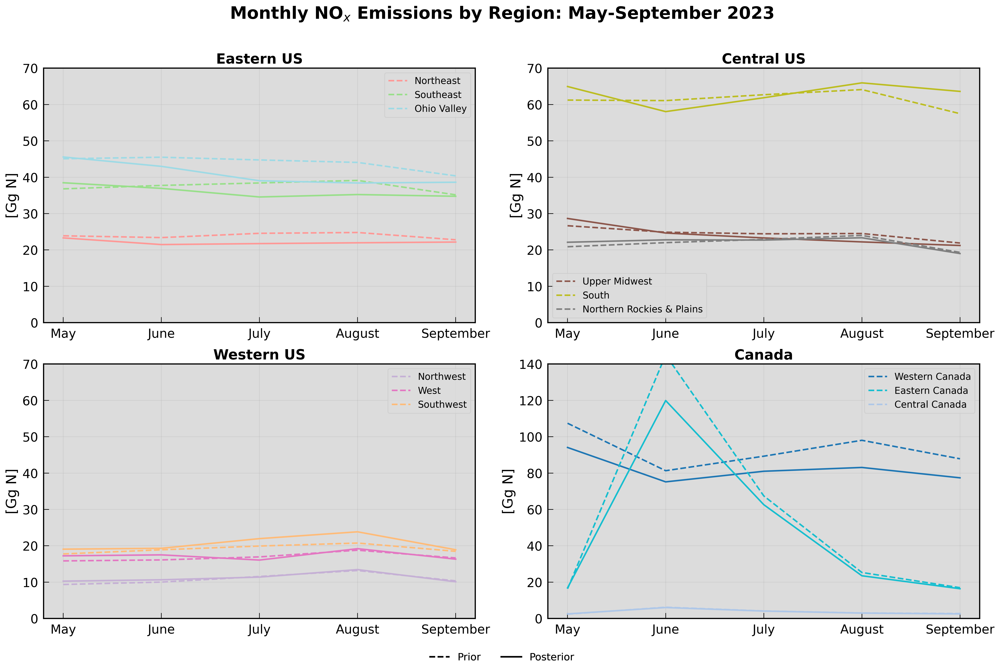

In [30]:
import random

# ...existing code...
import matplotlib.pyplot as plt

def plot_monthly_emissions_by_region(
    total_prior_emissions, total_posterior_emissions, region_masks, region_order, region_labels
):
    """
    Multipanel line plot of monthly emissions totals (Gg) by region.
    - Prior: dashed lines
    - Posterior: solid lines
    - Each region: unique color
    - Panels: East (NE, SE, OV), Central (UMW, S, NRP), West (NW, W, SW), Canada (CANW, CANE, CANC)
    """
    # Define region groups for panels
    panels = {
        "Eastern US": ["NE", "SE", "OV"],
        "Central US": ["UMW", "S", "NRP"],
        "Western US": ["NW", "W", "SW"],
        "Canada": ["CANW", "CANE", "CANC"]
    }
    panel_labels = list(panels.keys())

    # Get month labels and month numbers from the TSTEP coordinate
    months = pd.to_datetime(total_prior_emissions['TSTEP'].values).month
    month_names = ['May', 'June', 'July', 'August', 'September']
    month_numbers = [5, 6, 7, 8, 9]

    # Assign unique color to each region
    import matplotlib.cm as cm
    color_map = cm.get_cmap('tab20', len(region_order))
    region_indices = list(range(len(region_order)))
    random.seed(42)  # for reproducibility
    random.shuffle(region_indices)
    color_map = cm.get_cmap('tab20', len(region_order))
    region_colors = {region: color_map(region_indices[i]) for i, region in enumerate(region_order)}

    fig, axes = plt.subplots(2, 2, figsize=(18, 12), sharex=False, sharey=False)
    axes = axes.flatten()

    for i, (ax, (panel, regions)) in enumerate(zip(axes, panels.items())):
        for region in regions:
            if region not in region_order:
                continue
            mask = region_masks[region]
            prior_monthly = []
            post_monthly = []
            for m_num in month_numbers:
                month_mask = months == m_num
                prior = float((total_prior_emissions['NOx'].sel(TSTEP=month_mask).sum(dim='TSTEP') * mask).sum()) / 1e6  # Gg
                post = float((total_posterior_emissions['NOx'].sel(TSTEP=month_mask).sum(dim='TSTEP') * mask).sum()) / 1e6  # Gg
                prior_monthly.append(prior)
                post_monthly.append(post)
            color = region_colors[region]
            label = region_labels[region_order.index(region)]
            ax.plot(month_names, prior_monthly, '--', color=color, label=f"{label} (Prior)")
            ax.plot(month_names, post_monthly, '-', color=color, label=f"{label} (Posterior)")
        ax.set_title(panel, fontsize=18, fontweight='bold')
        ax.set_ylabel("[Gg N]")
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=11, loc='upper left', ncol=1, frameon=False)
        # ax.set_xlabel("Month")
        # Set y-axis limits
        if i < 3:
            ax.set_ylim(0, 70)
        else:
            ax.set_ylim(0, 140)
        # Only show region color in legend (once per region)
        handles, labels = ax.get_legend_handles_labels()
        region_handles = []
        region_labels_seen = set()
        for h, l in zip(handles, labels):
            region_name = l.split('(')[0].strip()
            if region_name not in region_labels_seen:
                region_handles.append(h)
                region_labels_seen.add(region_name)
        ax.legend(region_handles, [region_labels[region_order.index(r)] for r in regions if r in region_order],
              fontsize=12, loc='best', ncol=1, frameon=True, title="")

        # Add a separate legend for Prior/Posterior line styles
        import matplotlib.lines as mlines
        prior_line = mlines.Line2D([], [], color='black', linestyle='--', label='Prior')
        post_line = mlines.Line2D([], [], color='black', linestyle='-', label='Posterior')
        # Place legend at bottom center below all panels
        fig.legend([prior_line, post_line], ['Prior', 'Posterior'],
               loc='lower center', ncol=2, fontsize=13, frameon=False, bbox_to_anchor=(0.5, -0.01))
    plt.suptitle("Monthly NO$_x$ Emissions by Region: May-September 2023", fontsize=22, weight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.show()

plot_monthly_emissions_by_region(
    total_prior_emissions, total_posterior_emissions, region_masks, noaa_region_order, noaa_region_labels
)

In [31]:
import pandas as pd
from plotnine import (
    ggplot, aes, geom_line, facet_wrap, labs, theme, element_text, scale_color_manual, scale_linetype_manual, guides, guide_legend, ylim
)
from plotnine.themes.elements import element_rect
import numpy as np

def make_monthly_emissions_df(total_prior_emissions, total_posterior_emissions, region_masks, region_order, region_labels):
    months = pd.to_datetime(total_prior_emissions['TSTEP'].values).month
    month_names = ['May', 'June', 'July', 'August', 'September']
    month_numbers = [5, 6, 7, 8, 9]
    panel_map = {
        "Eastern US": ["NE", "SE", "OV"],
        "Central US": ["UMW", "S", "NRP"],
        "Western US": ["NW", "W", "SW"],
        "Canada": ["CANW", "CANE", "CANC"]
    }
    region_to_panel = {}
    for panel, regions in panel_map.items():
        for r in regions:
            region_to_panel[r] = panel

    records = []
    for region in region_order:
        if region not in region_to_panel:
            continue
        mask = region_masks[region]
        label = region_labels[region_order.index(region)]
        panel = region_to_panel[region]
        for m_num, m_name in zip(month_numbers, month_names):
            month_mask = months == m_num
            prior = float((total_prior_emissions['NOx'].sel(TSTEP=month_mask).sum(dim='TSTEP') * mask).sum()) / 1e6
            post = float((total_posterior_emissions['NOx'].sel(TSTEP=month_mask).sum(dim='TSTEP') * mask).sum()) / 1e6
            records.append(dict(
                Month=m_name, Region=label, Panel=panel, Emissions=prior, Type='Prior'
            ))
            records.append(dict(
                Month=m_name, Region=label, Panel=panel, Emissions=post, Type='Posterior'
            ))
    df = pd.DataFrame(records)
    return df

df = make_monthly_emissions_df(
    total_prior_emissions, total_posterior_emissions, region_masks, noaa_region_order, noaa_region_labels
)

# Add a column for grouping
df['Region_Type'] = df['Region'] + "_" + df['Type']

# Set y-limits for each panel
panel_limits = {
    "Eastern US": (0, 70),
    "Central US": (0, 70),
    "Western US": (0, 70),
    "Canada": (0, 140)
}

from plotnine import facet_wrap

# Custom facetting with y-limits
def facet_wrap_with_ylims(p, panel_limits):
    # plotnine doesn't support per-facet y-limits directly,
    # so we filter the data for each panel and plot separately, then combine.
    plots = []
    for panel, (ymin, ymax) in panel_limits.items():
        p_panel = (
            p
            + facet_wrap('~Panel', nrow=2)
            + ylim(ymin, ymax)
        )
        plots.append(p_panel)
    return plots[0]  # Only the first is needed if using facet_wrap

# Assign colors and linetypes
region_palette = dict(zip(noaa_region_labels, [
    "#1b9e77", "#d95f02", "#7570b3", "#e7298a", "#66a61e", "#e6ab02", "#a6761d", "#666666", "#377eb8", "#ff7f00", "#984ea3", "#a65628"
]))

p = (
    ggplot(df, aes('Month', 'Emissions', color='Region', linetype='Type', group='Region_Type'))
    + geom_line(size=1.2, alpha=1.0)
    + facet_wrap('~Panel', nrow=2)
    + scale_color_manual(values=region_palette)
    + scale_linetype_manual(values=type_linetypes)
    + labs(
        title="Monthly NO$_x$ Emissions by Region: May-September 2023",
        y="NO$_x$ Emissions [Gg N]",
        x="Month"
    )
    + theme(
        subplots_adjust={'wspace': 0.15, 'hspace': 0.25},
        axis_text_x=element_text(rotation=30, ha='right'),
        legend_title=element_text(size=12),
        legend_text=element_text(size=10),
        plot_title=element_text(size=18, weight='bold', ha='center'),
        strip_text=element_text(size=14, weight='bold'),
        panel_background=element_rect(fill='white', color='black')
    )
    + guides(
        color=guide_legend(title="Region", ncol=1),
        linetype=guide_legend(title="Type", ncol=1)
    )
)

print(p)

p.save("monthly_emissions_by_region.png", dpi=400, bbox_inches='tight', transparent=False)

NameError: name 'type_linetypes' is not defined

/tmp/ipykernel_1795630/4287625581.py:68: FutureWarning: Using print(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


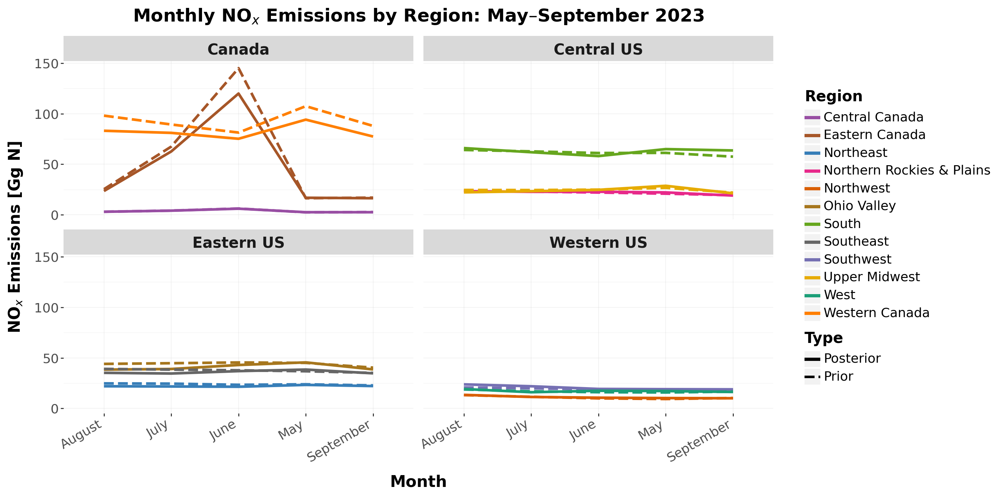

/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:606: PlotnineWarning: Saving 14 x 7 in image.
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:607: PlotnineWarning: Filename: monthly_emissions_by_region_plotnine.png
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


In [ ]:
def plot_monthly_emissions_by_region_plotnine(
    df,
    region_palette,
    type_linetypes,
    output_path="monthly_emissions_by_region.png",
    panel_limits=None
):
    """
    Plot monthly emissions by region using plotnine (ggplot-like).
    - df: DataFrame with columns ['Month', 'Emissions', 'Region', 'Type', 'Panel', 'Region_Type']
    - region_palette: dict mapping region label to color
    - type_linetypes: dict mapping 'Prior'/'Posterior' to linetype
    - output_path: where to save the PNG
    """
    from plotnine import (
        ggplot, aes, geom_line, facet_wrap, labs, theme, element_text,
        scale_color_manual, scale_linetype_manual, guides, guide_legend, ylim
    )
    from plotnine.themes.elements import element_rect, element_line

    # Shorten and wrap the title for better fit
    wrapped_title = "Monthly NO$_x$ Emissions by Region: May–September 2023"
    
    # If no panel_limits provided, use default
    if panel_limits is None:
        panel_limits = {
            "Eastern US": (0, 70),
            "Central US": (0, 70),
            "Western US": (0, 70),
            "Canada": (0, 140)
        }

    # Make the figure wider, reduce whitespace, and wrap the title for clarity
    p = (
        ggplot(df, aes('Month', 'Emissions', color='Region', linetype='Type', group='Region_Type'))
        + geom_line(size=1.5, alpha=1.0)
        + facet_wrap('~Panel', nrow=2)
        + scale_color_manual(values=region_palette)
        + scale_linetype_manual(values=type_linetypes)
        + labs(
            title=wrapped_title,
            y="NO$_x$ Emissions [Gg N]",
            x="Month"
        )
        + theme(
            figure_size=(14, 7),
            subplots_adjust={'wspace': 0.22, 'hspace': 0.22, 'left': 0.08, 'right': 0.98, 'top': 0.90, 'bottom': 0.13},
            axis_text_x=element_text(rotation=30, ha='right', size=13),
            axis_text_y=element_text(size=13),
            axis_title_x=element_text(size=16, weight='bold'),
            axis_title_y=element_text(size=16, weight='bold'),
            legend_title=element_text(size=15, weight='bold'),
            legend_text=element_text(size=13),
            plot_title=element_text(size=18, weight='bold', ha='center'),
            strip_text=element_text(size=15, weight='bold'),
            panel_background=element_rect(fill='white', color='black'),
            plot_background=element_rect(fill='white', color='white'),
            legend_position='right',
            panel_grid_major=element_line(color='lightgray', size=0.7),
            panel_grid_minor=element_line(color='lightgray', size=0.4)
        )
        + guides(
            color=guide_legend(title="Region", ncol=1),
            linetype=guide_legend(title="Type", ncol=1)
        )
    )

    print(p)
    p.save(output_path, dpi=400, bbox_inches='tight', transparent=False)

panel_limits = {
    "Eastern US": (0, 70),
    "Central US": (0, 70),
    "Western US": (0, 70),
    "Canada": (0, 140)
}
plot_monthly_emissions_by_region_plotnine(
    df, region_palette, type_linetypes,
    output_path="monthly_emissions_by_region_plotnine.png",
    panel_limits=None
)


/tmp/ipykernel_1795630/4051736135.py:70: FutureWarning: Using print(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


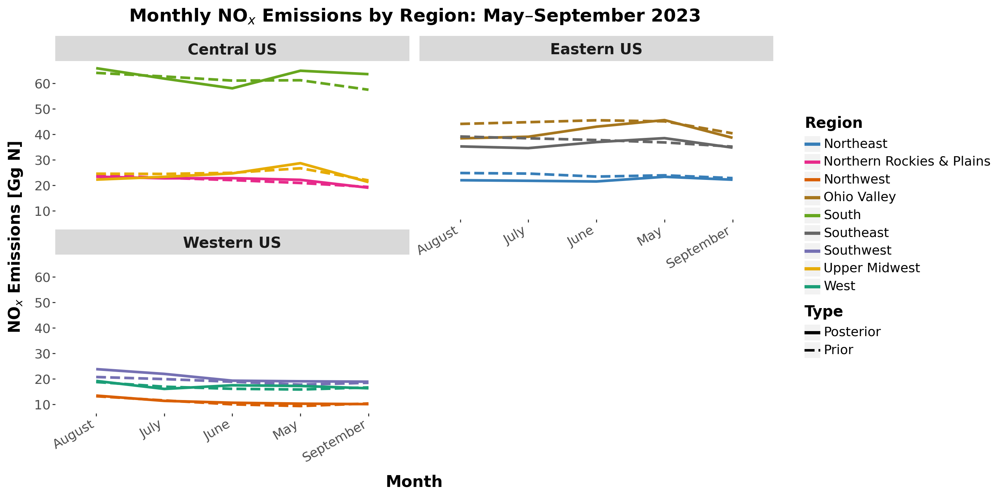

/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:606: PlotnineWarning: Saving 14 x 7 in image.
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:607: PlotnineWarning: Filename: monthly_emissions_by_region_plotnine.png
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


In [ ]:
def plot_monthly_emissions_by_region_plotnine(
    df,
    region_palette,
    type_linetypes,
    output_path="monthly_emissions_by_region.png",
    panel_limits=None
):
    """
    Plot monthly emissions by region using plotnine (ggplot-like).
    Only the 3 US panels (Eastern, Central, Western US) are included.
    - df: DataFrame with columns ['Month', 'Emissions', 'Region', 'Type', 'Panel', 'Region_Type']
    - region_palette: dict mapping region label to color
    - type_linetypes: dict mapping 'Prior'/'Posterior' to linetype
    - output_path: where to save the PNG
    """
    from plotnine import (
        ggplot, aes, geom_line, facet_wrap, labs, theme, element_text,
        scale_color_manual, scale_linetype_manual, guides, guide_legend, ylim
    )
    from plotnine.themes.elements import element_rect

    # Only keep US panels
    us_panels = ["Eastern US", "Central US", "Western US"]
    df_us = df[df["Panel"].isin(us_panels)].copy()

    # Shorten and wrap the title for better fit
    wrapped_title = "Monthly NO$_x$ Emissions by Region: May–September 2023"
    
    # If no panel_limits provided, use default for US panels
    if panel_limits is None:
        panel_limits = {
            "Eastern US": (0, 70),
            "Central US": (0, 70),
            "Western US": (0, 70)
        }

    # Plot with only the 3 US panels, 2 rows, 2 columns (bottom right empty)
    p = (
        ggplot(df_us, aes('Month', 'Emissions', color='Region', linetype='Type', group='Region_Type'))
        + geom_line(size=1.5, alpha=1.0)
        + facet_wrap('~Panel', nrow=2)
        + scale_color_manual(values=region_palette)
        + scale_linetype_manual(values=type_linetypes)
        + labs(
            title=wrapped_title,
            y="NO$_x$ Emissions [Gg N]",
            x="Month"
        )
        + theme(
            figure_size=(14, 7),
            subplots_adjust={'wspace': 0.22, 'hspace': 0.22, 'left': 0.08, 'right': 0.98, 'top': 0.90, 'bottom': 0.13},
            axis_text_x=element_text(rotation=30, ha='right', size=13),
            axis_text_y=element_text(size=13),
            axis_title_x=element_text(size=16, weight='bold'),
            axis_title_y=element_text(size=16, weight='bold'),
            legend_title=element_text(size=15, weight='bold'),
            legend_text=element_text(size=13),
            plot_title=element_text(size=18, weight='bold', ha='center'),
            strip_text=element_text(size=15, weight='bold'),
            panel_background=element_rect(fill='white', color='black'),
            plot_background=element_rect(fill='white', color='white'),
            legend_position='right'
        )
        + guides(
            color=guide_legend(title="Region", ncol=1),
            linetype=guide_legend(title="Type", ncol=1)
        )
    )

    print(p)
    p.save(output_path, dpi=400, bbox_inches='tight', transparent=False)

# Usage: Only US panels, 3-panel plot (Canada omitted)
panel_limits = {
    "Eastern US": (0, 70),
    "Central US": (0, 70),
    "Western US": (0, 70)
}
plot_monthly_emissions_by_region_plotnine(
    df, region_palette, type_linetypes,
    output_path="monthly_emissions_by_region_plotnine.png",
    panel_limits=None
)

/tmp/ipykernel_1795630/3799909944.py:72: FutureWarning: Using print(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


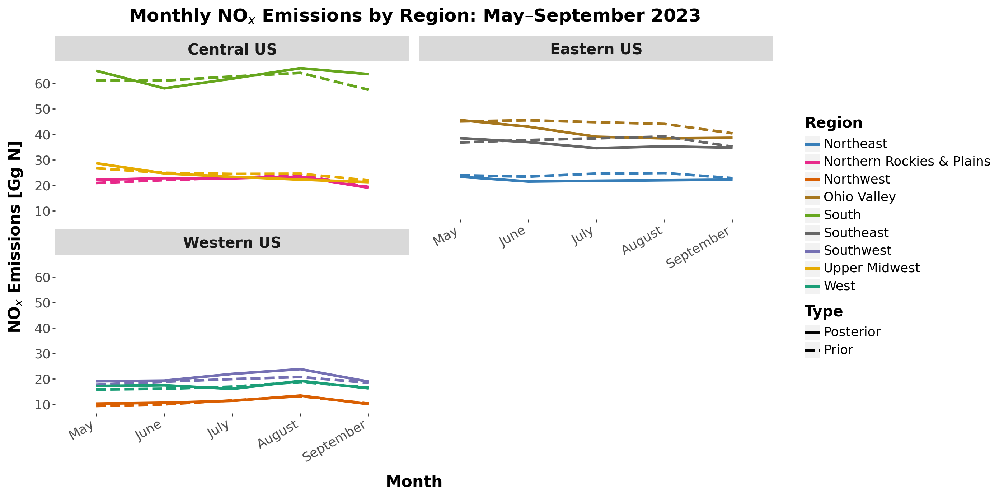

/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:606: PlotnineWarning: Saving 14 x 7 in image.
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:607: PlotnineWarning: Filename: monthly_emissions_by_region_plotnine.png
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


In [ ]:
def plot_monthly_emissions_by_region_plotnine(
    df,
    region_palette,
    type_linetypes,
    output_path="monthly_emissions_by_region.png",
    panel_limits=None
):
    """
    Plot monthly emissions by region using plotnine (ggplot-like).
    Only the 3 US panels (Eastern, Central, Western US) are included.
    - df: DataFrame with columns ['Month', 'Emissions', 'Region', 'Type', 'Panel', 'Region_Type']
    - region_palette: dict mapping region label to color
    - type_linetypes: dict mapping 'Prior'/'Posterior' to linetype
    - output_path: where to save the PNG
    """
    from plotnine import (
        ggplot, aes, geom_line, facet_wrap, labs, theme, element_text,
        scale_color_manual, scale_linetype_manual, guides, guide_legend, ylim, scale_x_discrete
    )
    from plotnine.themes.elements import element_rect

    # Only keep US panels
    us_panels = ["Eastern US", "Central US", "Western US"]
    df_us = df[df["Panel"].isin(us_panels)].copy()

    # Ensure months are ordered May–September
    month_order = ["May", "June", "July", "August", "September"]
    df_us["Month"] = pd.Categorical(df_us["Month"], categories=month_order, ordered=True)

    wrapped_title = "Monthly NO$_x$ Emissions by Region: May–September 2023"
    
    if panel_limits is None:
        panel_limits = {
            "Eastern US": (0, 70),
            "Central US": (0, 70),
            "Western US": (0, 70)
        }

    p = (
        ggplot(df_us, aes('Month', 'Emissions', color='Region', linetype='Type', group='Region_Type'))
        + geom_line(size=1.5, alpha=1.0)
        + facet_wrap('~Panel', nrow=2)
        + scale_x_discrete(limits=month_order)
        + scale_color_manual(values=region_palette)
        + scale_linetype_manual(values=type_linetypes)
        + labs(
            title=wrapped_title,
            y="NO$_x$ Emissions [Gg N]",
            x="Month"
        )
        + theme(
            figure_size=(14, 7),
            subplots_adjust={'wspace': 0.22, 'hspace': 0.22, 'left': 0.08, 'right': 0.98, 'top': 0.90, 'bottom': 0.13},
            axis_text_x=element_text(rotation=30, ha='right', size=13),
            axis_text_y=element_text(size=13),
            axis_title_x=element_text(size=16, weight='bold'),
            axis_title_y=element_text(size=16, weight='bold'),
            legend_title=element_text(size=15, weight='bold'),
            legend_text=element_text(size=13),
            plot_title=element_text(size=18, weight='bold', ha='center'),
            strip_text=element_text(size=15, weight='bold'),
            panel_background=element_rect(fill='white', color='black'),
            plot_background=element_rect(fill='white', color='white'),
            legend_position='right'
        )
        + guides(
            color=guide_legend(title="Region", ncol=1),
            linetype=guide_legend(title="Type", ncol=1)
        )
    )

    print(p)
    p.save(output_path, dpi=400, bbox_inches='tight', transparent=False)

# Usage: Only US panels, 3-panel plot (Canada omitted)
panel_limits = {
    "Eastern US": (0, 65),
    "Central US": (0, 65),
    "Western US": (0, 65)
}
plot_monthly_emissions_by_region_plotnine(
    df, region_palette, type_linetypes,
    output_path="monthly_emissions_by_region_plotnine.png",
    panel_limits=None
)

/tmp/ipykernel_1795630/138597987.py:83: FutureWarning: Using print(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


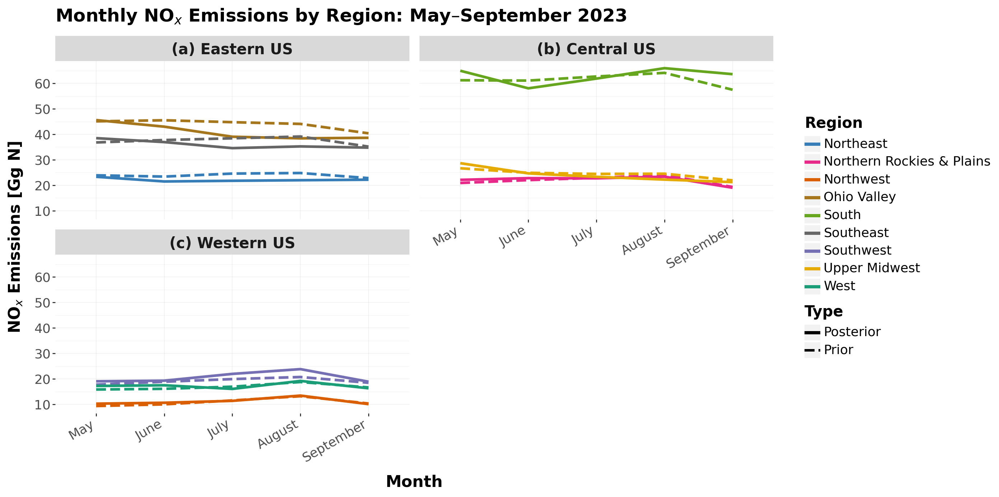

/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:606: PlotnineWarning: Saving 14 x 7 in image.
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:607: PlotnineWarning: Filename: monthly_emissions_by_region_plotnine.png
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


In [ ]:
def plot_monthly_emissions_by_region_plotnine(
    df,
    region_palette,
    type_linetypes,
    output_path="monthly_emissions_by_region.png",
    panel_limits=None
):
    """
    Plot monthly emissions by region using plotnine (ggplot-like).
    Only the 3 US panels (Eastern, Central, Western US) are included.
    Adds (a), (b), (c) to each panel.
    - df: DataFrame with columns ['Month', 'Emissions', 'Region', 'Type', 'Panel', 'Region_Type']
    - region_palette: dict mapping region label to color
    - type_linetypes: dict mapping 'Prior'/'Posterior' to linetype
    - output_path: where to save the PNG
    """
    from plotnine import (
        ggplot, aes, geom_line, facet_wrap, labs, theme, element_text,
        scale_color_manual, scale_linetype_manual, guides, guide_legend, ylim, scale_x_discrete, facet_wrap
    )
    from plotnine.themes.elements import element_rect, element_line

    # Only keep US panels
    us_panels = ["Eastern US", "Central US", "Western US"]
    df_us = df[df["Panel"].isin(us_panels)].copy()

    # Ensure months are ordered May–September
    month_order = ["May", "June", "July", "August", "September"]
    df_us["Month"] = pd.Categorical(df_us["Month"], categories=month_order, ordered=True)

    # Map panel names to (a), (b), (c)
    panel_map = {
        "Eastern US": "(a) Eastern US",
        "Central US": "(b) Central US",
        "Western US": "(c) Western US"
    }
    df_us["Panel"] = df_us["Panel"].map(panel_map)

    wrapped_title = "Monthly NO$_x$ Emissions by Region: May–September 2023"
    
    if panel_limits is None:
        panel_limits = {
            "(a) Eastern US": (0, 70),
            "(b) Central US": (0, 70),
            "(c) Western US": (0, 70)
        }

    p = (
        ggplot(df_us, aes('Month', 'Emissions', color='Region', linetype='Type', group='Region_Type'))
        + geom_line(size=1.5, alpha=1.0)
        + facet_wrap('~Panel', nrow=2)
        + scale_x_discrete(limits=month_order)
        + scale_color_manual(values=region_palette)
        + scale_linetype_manual(values=type_linetypes)
        + labs(
            title=wrapped_title,
            y="NO$_x$ Emissions [Gg N]",
            x="Month"
        )
        + theme(
            figure_size=(14, 7),
            subplots_adjust={'wspace': 0.22, 'hspace': 0.22, 'left': 0.08, 'right': 0.98, 'top': 0.90, 'bottom': 0.13},
            axis_text_x=element_text(rotation=30, ha='right', size=13),
            axis_text_y=element_text(size=13),
            axis_title_x=element_text(size=16, weight='bold'),
            axis_title_y=element_text(size=16, weight='bold'),
            legend_title=element_text(size=15, weight='bold'),
            legend_text=element_text(size=13),
            plot_title=element_text(size=18, weight='bold', ha='left'),
            strip_text=element_text(size=15, weight='bold'),
            panel_grid_major=element_line(color='lightgray', size=0.7),
            panel_grid_minor=element_line(color='lightgray', size=0.4),
            panel_background=element_rect(fill='white', color='black'),
            plot_background=element_rect(fill='white', color='white'),
            legend_position='right'
        )
        + guides(
            color=guide_legend(title="Region", ncol=1),
            linetype=guide_legend(title="Type", ncol=1)
        )
    )

    print(p)
    p.save(output_path, dpi=400, bbox_inches='tight', transparent=False)

# Usage: Only US panels, 3-panel plot (Canada omitted)
panel_limits = {
    "(a) Eastern US": (0, 70),
    "(b) Central US": (0, 70),
    "(c) Western US": (0, 70)
}
plot_monthly_emissions_by_region_plotnine(
    df, region_palette, type_linetypes,
    output_path="monthly_emissions_by_region_plotnine.png",
    panel_limits=None
)

/tmp/ipykernel_1795630/2781766015.py:69: FutureWarning: Using print(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


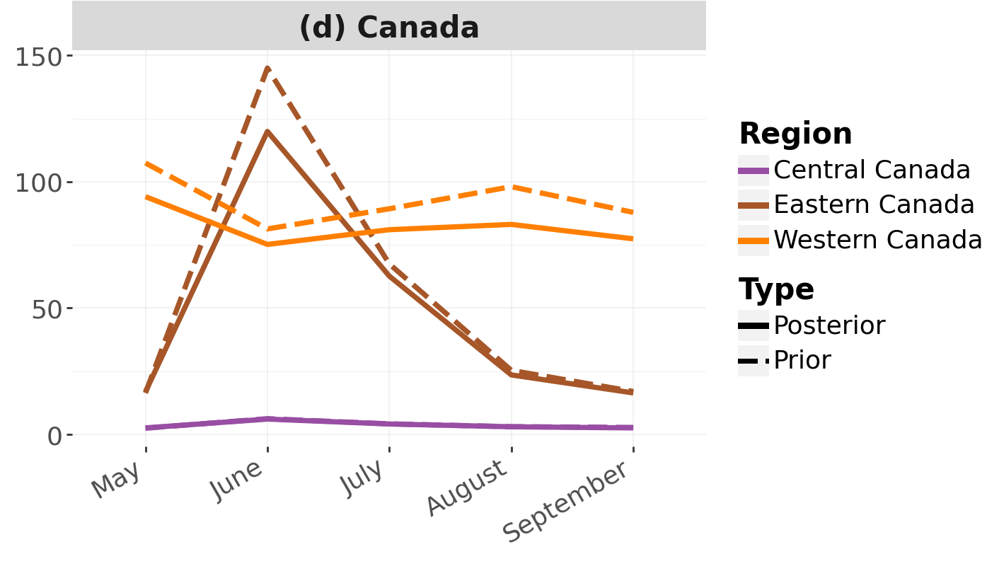

/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:606: PlotnineWarning: Saving 7 x 4 in image.
/home/jkumm/.local/lib/python3.9/site-packages/plotnine/ggplot.py:607: PlotnineWarning: Filename: monthly_emissions_by_region_canada.png


/home/jkumm/.local/lib/python3.9/site-packages/plotnine/themes/themeable.py:2419: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


In [ ]:
def plot_monthly_emissions_canada_plotnine(
    df,
    region_palette,
    type_linetypes,
    output_path="monthly_emissions_by_region_canada.png",
    panel_limits=None
):
    """
    Plot monthly emissions by region for Canada using plotnine (ggplot-like).
    Only the Canada panel is included, labeled as (d) Canada.
    - df: DataFrame with columns ['Month', 'Emissions', 'Region', 'Type', 'Panel', 'Region_Type']
    - region_palette: dict mapping region label to color
    - type_linetypes: dict mapping 'Prior'/'Posterior' to linetype
    - output_path: where to save the PNG
    """
    from plotnine import (
        ggplot, aes, geom_line, facet_wrap, labs, theme, element_text,
        scale_color_manual, scale_linetype_manual, guides, guide_legend, scale_x_discrete
    )
    from plotnine.themes.elements import element_rect, element_line

    # Only keep Canada panel
    df_ca = df[df["Panel"] == "Canada"].copy()

    # Ensure months are ordered May–September
    month_order = ["May", "June", "July", "August", "September"]
    df_ca["Month"] = pd.Categorical(df_ca["Month"], categories=month_order, ordered=True)

    # Label panel as (d) Canada
    df_ca["Panel"] = "(d) Canada"

    if panel_limits is None:
        panel_limits = {"(d) Canada": (0, 140)}

    p = (
        ggplot(df_ca, aes('Month', 'Emissions', color='Region', linetype='Type', group='Region_Type'))
        + geom_line(size=1.5, alpha=1.0)
        + facet_wrap('~Panel', nrow=1)
        + scale_x_discrete(limits=month_order)
        + scale_color_manual(values=region_palette)
        + scale_linetype_manual(values=type_linetypes)
        + labs(
            y="",
            x=""
        )
        + theme(
            figure_size=(7, 4),
            subplots_adjust={'wspace': 0.22, 'hspace': 0.22, 'left': 0.13, 'right': 0.98, 'top': 0.97, 'bottom': 0.18},
            axis_text_x=element_text(rotation=30, ha='right', size=13),
            axis_text_y=element_text(size=13),
            axis_title_x=element_text(size=16, weight='bold'),
            axis_title_y=element_text(size=16, weight='bold'),
            legend_title=element_text(size=15, weight='bold'),
            legend_text=element_text(size=13),
            plot_title=element_text(size=18, weight='bold', ha='left'),
            strip_text=element_text(size=15, weight='bold'),
            panel_grid_major=element_line(color='lightgray', size=0.7),
            panel_grid_minor=element_line(color='lightgray', size=0.4),
            panel_background=element_rect(fill='white', color='black'),
            plot_background=element_rect(fill='white', color='white'),
            legend_position='right'
        )
        + guides(
            color=guide_legend(title="Region", ncol=1),
            linetype=guide_legend(title="Type", ncol=1)
        )
    )

    print(p)
    p.save(output_path, dpi=400, bbox_inches='tight', transparent=False)

# Usage: Canada panel only
panel_limits_ca = {"(d) Canada": (0, 140)}
plot_monthly_emissions_canada_plotnine(
    df, region_palette, type_linetypes,
    output_path="monthly_emissions_by_region_canada.png",
    panel_limits=panel_limits_ca
)